# Capstone 3 Exploratory Data Analysis

OBJECTIVE: Analyze features for correlations between features and target. Obtain trends or insights from data visualizations which enrich understanding of relationships among features and between features and target.

PROCEDURE:

1.  For each feature, plot weekly_sales to visualize unusual trends and/or deduce correlations.
2.  In general two scatterplot strategies used.    
    a.  a scatterplot of weekly_sales aggregated by Store vs Feature.  
    b.  a scatterplot of weekly_sales aggregated by Dept vs Feature.

SUMMARY:

 * TYPE  
     1. 'Type' feature is based on total weekly_sales amount.  Types A, B, and C have distinct weekly_sales ranges. 
     2.  there are 22 Type A Stores  
        there are 17 Type B Stores<br>
        there are 6 Type C Stores<br>
     3.  Stores evaluated for 'Type' assignment.  Should following stores, 36, 33, 5, 3, 30 be reassigned to Class C?  Based on Weekly Sales, yes. <br>
      
      
 * DEPT
     1.  Cumulutive sales grouped by dept over date range shows strong peaks.
     2.  Top Five Departments in Total Sales: <br>
     	Dept	Weekly_Sales <br>
        92	4.839433e+08 <br>
        95	4.493202e+08 <br>
        38	3.931181e+08 <br>
        72	3.057252e+08 <br>
        90	2.910685e+08 <br>
        
        
 * ISHOLIDAY  
     1.  Several departments show considerable difference in 'Weekly_Sales' dependent on 'IsHoliday' Feature <br> 
     

 * SIZE
     1.  Larger Store size correlated with large weekly_sales?  Yes, regression plot shows increased weekly_sales for larger store size.
    
    <br>

 * CCI_VALUE 
     1. For each Dept, a scatterplot of Weekly_Sales vs Date colored by cci_value does not indicate positive 
     correlation.

 * TEMPERATURE  
     1.  for each store, scatterplot of aggregated weekly_sales for each date vs. temperature.  no positive correlations for any store.
     <br>

 * FUEL_PRICE  
     1.  Scatterplot of weekly_sales vs fuel prices does not indicate correlation between the two.

 * MARKDOWNS
     1. Scatterplots of weekly_sales vs MarkDown1, MarkDown2, MarkDown3, MarkDown4, MarkDown5 do not 
     indicate strong positive correlations

 * CPI  
    1.  CPI steadily increases over date range. begins roughly 167 and ends slightly above 176.
    2.  scatteplot of weekly_sales summed over all stores vs CPI values does not indicate correlation
  
 * UNEMPLOYMENT  
     1.  Scatterplots of weekly_sales vs unemployment rate does not indicate positive correlations.
     
 * CORRELATION HEATMAP:
     1.  'Size' Feature has largest correlation value, 0.24, with Weekly_Sales.  This is not indicative of a strong correlation.  
     2.  All other numerical features correlation values fall in range from -0.0034 to 0.047. <BR>  
     3.  Correlation Heatmap reinforces deductions regarding correlations between weekly_sales and features from scatterplot visualizations.
    
 * PRINCIPAL COMPONENT ANALYSIS  
    1. first principal component is responsible for approx. 20% of variance.  
    2. second principal component is responsible for approx. 11% of variance.  
    3. remaining explained variance is spread relatively evenly over remaining principal components.  
    4.  feature selection using first two principal components possible?

# Import Modules

In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import seaborn as sns

import datetime

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
%matplotlib inline

# Import Data

import final tidy version of data wrangling results, capstone_3_wrnglng_results.csv

In [16]:
df = pd.read_csv('./capstone_3_train_data')


In [17]:
print("df_train shape: {}\n".format(df.shape))
df.info()

df_train shape: (421570, 18)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Date          421570 non-null  object 
 1   Store         421570 non-null  int64  
 2   Dept          421570 non-null  int64  
 3   Weekly_Sales  421570 non-null  float64
 4   IsHoliday     421570 non-null  int64  
 5   Temperature   421570 non-null  float64
 6   Fuel_Price    421570 non-null  float64
 7   MarkDown1     421570 non-null  float64
 8   MarkDown2     421570 non-null  float64
 9   MarkDown3     421570 non-null  float64
 10  MarkDown4     421570 non-null  float64
 11  MarkDown5     421570 non-null  float64
 12  CPI           421570 non-null  float64
 13  Unemployment  421570 non-null  float64
 14  isocalendar   421570 non-null  object 
 15  Type          421570 non-null  object 
 16  Size          421570 non-null  int64  
 17  cci_value     4215

In [18]:
# set Store, Dept, Type columns to category data type

df['Store'] = df['Store'].astype('category')
df['Dept'] = df['Dept'].astype('category')
df['Type'] = df['Type'].astype('category')
df['IsHoliday'] = df['IsHoliday'].astype('category')

In [19]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 421570 entries, 0 to 421569
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype   
---  ------        --------------   -----   
 0   Date          421570 non-null  object  
 1   Store         421570 non-null  category
 2   Dept          421570 non-null  category
 3   Weekly_Sales  421570 non-null  float64 
 4   IsHoliday     421570 non-null  category
 5   Temperature   421570 non-null  float64 
 6   Fuel_Price    421570 non-null  float64 
 7   MarkDown1     421570 non-null  float64 
 8   MarkDown2     421570 non-null  float64 
 9   MarkDown3     421570 non-null  float64 
 10  MarkDown4     421570 non-null  float64 
 11  MarkDown5     421570 non-null  float64 
 12  CPI           421570 non-null  float64 
 13  Unemployment  421570 non-null  float64 
 14  isocalendar   421570 non-null  object  
 15  Type          421570 non-null  category
 16  Size          421570 non-null  int64   
 17  cci_value     421570 non-null

In [300]:
df.head()

,Date,Store,Dept,Weekly_Sales,IsHoliday,isocalendar,Type,Size,cci_value,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment
0,2010-02-05,1,1,24924.50,0,"(2010, 5)",A,151315,98.22324,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106
1,2010-02-12,1,1,46039.49,1,"(2010, 6)",A,151315,98.22324,38.51,2.548,0.0,0.0,0.0,0.0,0.0,211.242170,8.106
2,2010-02-19,1,1,41595.55,0,"(2010, 7)",A,151315,98.22324,39.93,2.514,0.0,0.0,0.0,0.0,0.0,211.289143,8.106
3,2010-02-26,1,1,19403.54,0,"(2010, 8)",A,151315,98.22324,46.63,2.561,0.0,0.0,0.0,0.0,0.0,211.319643,8.106
4,2010-03-05,1,1,21827.90,0,"(2010, 9)",A,151315,98.21968,46.50,2.625,0.0,0.0,0.0,0.0,0.0,211.350143,8.106


# Type Feature

## Objective:  Understand how the Type Feature relates to the weekly sales

Summary:

1. 'Type' feature is based on total weekly_sales amount.  Types A, B, and C have distinct weekly_sales ranges. <br>
2.  there are 22 Type A Stores<br>
    there are 17 Type B Stores<br>
    there are 6 Type C Stores<br>
3.  Stores evaluated for 'Type' assignment.  Should following stores, 36, 33, 5, 3, 30 be reassigned to Class C?  Based on Weekly Sales, yes.

### Weekly Sales by Store Type

In [20]:
print("there are {} Type A Stores".format(df[df['Type']=='A']['Store'].nunique()))
print("there are {} Type B Stores".format(df[df['Type']=='B']['Store'].nunique()))
print("there are {} Type C Stores".format(df[df['Type']=='C']['Store'].nunique()))

there are 22 Type A Stores
there are 17 Type B Stores
there are 6 Type C Stores


In [21]:
# Sort df by 'Date', 'Store'
df.sort_values(['Date','Store'])

,Date,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,isocalendar,Type,Size,cci_value
0,2010-02-05,1,1,24924.50,0,42.31,2.572,0.00,0.00,0.0,0.00,0.00,211.096358,8.106,"(2010, 5)",A,151315,98.22324
1,2010-02-05,1,2,50605.27,0,42.31,2.572,0.00,0.00,0.0,0.00,0.00,211.096358,8.106,"(2010, 5)",A,151315,98.22324
2,2010-02-05,1,3,13740.12,0,42.31,2.572,0.00,0.00,0.0,0.00,0.00,211.096358,8.106,"(2010, 5)",A,151315,98.22324
3,2010-02-05,1,4,39954.04,0,42.31,2.572,0.00,0.00,0.0,0.00,0.00,211.096358,8.106,"(2010, 5)",A,151315,98.22324
4,2010-02-05,1,5,32229.38,0,42.31,2.572,0.00,0.00,0.0,0.00,0.00,211.096358,8.106,"(2010, 5)",A,151315,98.22324
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
421565,2012-10-26,45,93,2487.80,0,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,"(2012, 43)",B,118221,99.10398
421566,2012-10-26,45,94,5203.31,0,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,"(2012, 43)",B,118221,99.10398
421567,2012-10-26,45,95,56017.47,0,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,"(2012, 43)",B,118221,99.10398
421568,2012-10-26,45,97,6817.48,0,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,"(2012, 43)",B,118221,99.10398


In [22]:
#create df_. df_ 'Weekly_Sales' is sum of weekly_sales across all dept in a store for a particular week.
df_ = df.groupby(['Date','Store'])['Weekly_Sales'].sum().reset_index()
df_.head()

,Date,Store,Weekly_Sales
0,2010-02-05,1,1643690.90
1,2010-02-05,2,2136989.46
2,2010-02-05,3,461622.22
3,2010-02-05,4,2135143.87
4,2010-02-05,5,317173.10


In [23]:
#create list of Store numbers that are Type A

a_list = df[df['Type']=='A']['Store'].unique().to_list()
b_list = df[df['Type']=='B']['Store'].unique().to_list()
c_list = df[df['Type']=='C']['Store'].unique().to_list()

In [24]:
df.head()

,Date,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,isocalendar,Type,Size,cci_value
0,2010-02-05,1,1,24924.50,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
1,2010-02-05,1,2,50605.27,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
2,2010-02-05,1,3,13740.12,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
3,2010-02-05,1,4,39954.04,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
4,2010-02-05,1,5,32229.38,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324


In [25]:
# list comprehension to create list of A, B, C depending on "Store" values
list = ['A' if x in a_list else 'B' if x in b_list else 'C' if x in c_list else 'wtf' for x in df['Store'] ]
list

z = pd.DataFrame(list)

# assign new column of store type
#df_['Type'] = ['A' if x in a_list else 'B' if x in b_list else 'C' if x in c_list else 'wtf' for x in z['Store']]
#df_

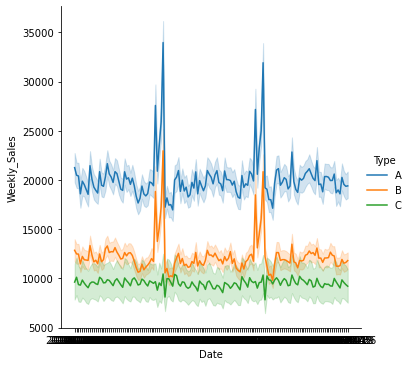

In [26]:
# how do weekly_sales differ between store types?  Three tiers.  A is largest, followed by B.  C is smallest 
# in scale.  C also lacks two sharp peaks.

# relplot example

sns.relplot(
    data=df, kind="line",
    x="Date", y="Weekly_Sales",
    hue="Type",
    facet_kws=dict(sharex=False))

plt.show()

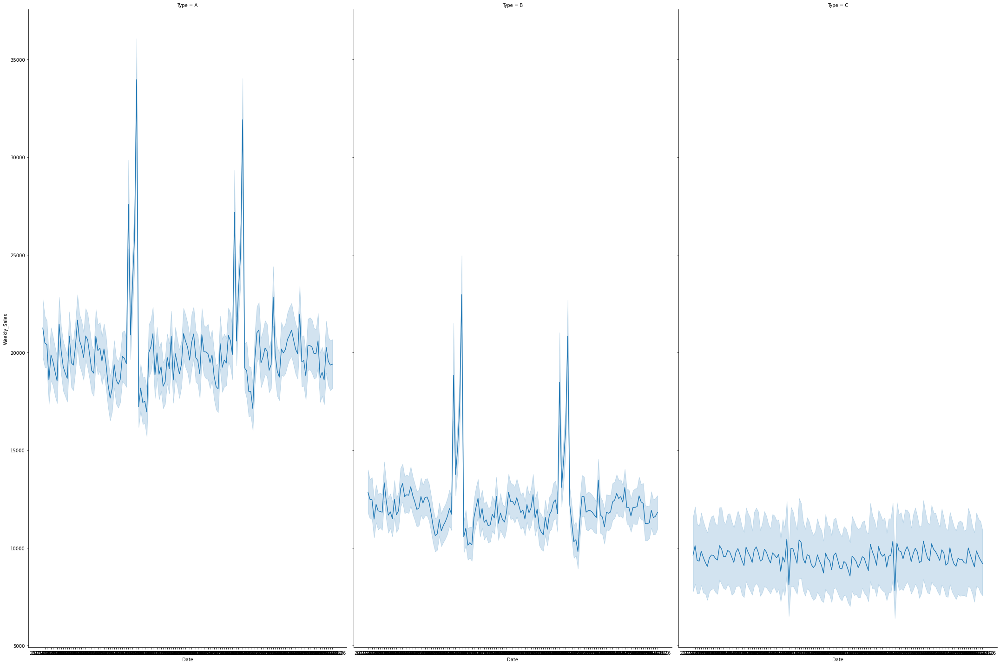

<Figure size 432x288 with 0 Axes>

In [27]:
# Create a FacetGrid varying by column and columns ordered with the degree_order variable
g = sns.FacetGrid(df, col="Type", col_order=['A', 'B', 'C'], height = 20, aspect = 0.5)

# Map a scatter plot of Undergrad Population compared to PCTPELL
g.map(sns.lineplot, 'Date', 'Weekly_Sales')

plt.show()
plt.clf()

### Checking Stores 36, 33, 5, 3, 30

In [28]:
df.head()

,Date,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,isocalendar,Type,Size,cci_value
0,2010-02-05,1,1,24924.50,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
1,2010-02-05,1,2,50605.27,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
2,2010-02-05,1,3,13740.12,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
3,2010-02-05,1,4,39954.04,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
4,2010-02-05,1,5,32229.38,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324


In [29]:
# Stores to be reevaluated for 'Type'.  Should following stores, 36, 33, 5, 3, 30 be reassigned to Class C?
# Based on Weekly Sales, yes.

list =[36,33,5,3,30]


In [30]:
# rework df to aggregate Weekly_Sales for each stores

df_ = df.sort_values(['Date','Store']).groupby(['Date','Store'])['Weekly_Sales'].sum().reset_index()
df_['Type'] = ['A' if x in a_list else 'B' if x in b_list else 'C' if x in c_list else 'wtf' for x in df_['Store'] ]

In [31]:
df_

,Date,Store,Weekly_Sales,Type
0,2010-02-05,1,1643690.90,A
1,2010-02-05,2,2136989.46,A
2,2010-02-05,3,461622.22,B
3,2010-02-05,4,2135143.87,A
4,2010-02-05,5,317173.10,B
...,...,...,...,...
6430,2012-10-26,41,1316542.59,A
6431,2012-10-26,42,514756.08,C
6432,2012-10-26,43,587603.55,C
6433,2012-10-26,44,361067.07,C


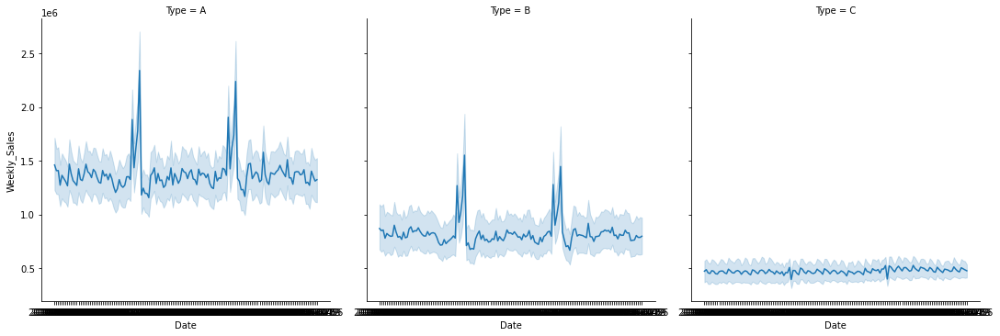

<Figure size 432x288 with 0 Axes>

In [32]:
sns.relplot(data=df_, x='Date', y='Weekly_Sales',
           kind = 'line', col='Type', col_order= ['A','B','C'])

plt.show()
plt.clf()

In [33]:
df_.head()

,Date,Store,Weekly_Sales,Type
0,2010-02-05,1,1643690.90,A
1,2010-02-05,2,2136989.46,A
2,2010-02-05,3,461622.22,B
3,2010-02-05,4,2135143.87,A
4,2010-02-05,5,317173.10,B


In [34]:
c_weekly_sales_avg = df_[df_['Type'] == 'C'].groupby('Date').mean()
b_weekly_sales_avg = df_[df_['Type'] == 'B'].groupby('Date').mean()

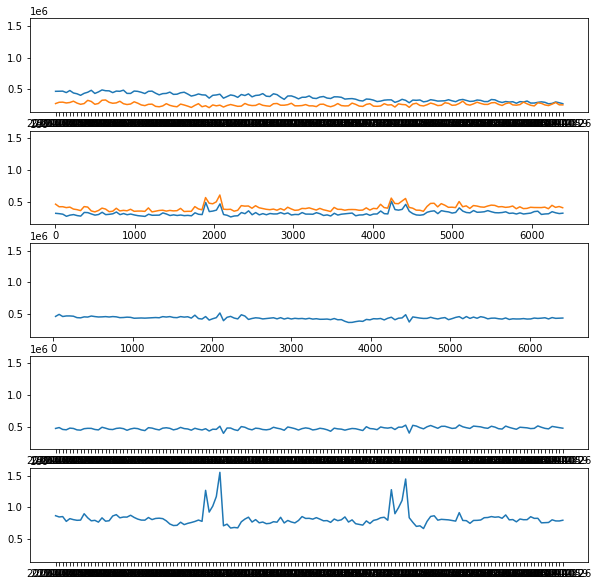

In [35]:
fig, ax = plt.subplots(5, 1, sharey=True, figsize=(10,10))

ax[0].plot(df_[df_['Store'] == 36]['Date'], df_[df_['Store'] == 36]['Weekly_Sales'])
ax[0].plot(df_[df_['Store'] == 33]['Date'],  df_[df_['Store'] == 33]['Weekly_Sales'])

ax[1].plot(df_[df_['Store'] == 5]['Weekly_Sales'])
ax[1].plot(df_[df_['Store'] == 3]['Weekly_Sales'])

ax[2].plot(df_[df_['Store'] == 30]['Weekly_Sales'])

ax[3].plot(c_weekly_sales_avg)

ax[4].plot(b_weekly_sales_avg)

plt.show()

In [ ]:
# Reassign Store Classification?

# Department 

## How does Department feature relate to weekly sales?

1.  First approach -  Groupby 'Date', 'Dept'.  Sum up weekly sales.  Present dept weekly sales across all stores.

In [121]:
df.head()

,Date,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,...,Type,Size,cci_value,PC 1,PC 2,PC 3,PC 4,PC 5,PC 6,PC 7
0,2010-02-05,1,1,24924.50,0,42.31,2.572,0.0,0.0,0.0,...,A,151315,98.22324,-0.682031,-1.417282,1.226041,-0.163134,-0.661136,-0.526291,0.865044
1,2010-02-05,1,2,50605.27,0,42.31,2.572,0.0,0.0,0.0,...,A,151315,98.22324,-0.592232,-1.524587,1.388023,0.536780,-1.004173,-0.693797,0.667283
2,2010-02-05,1,3,13740.12,0,42.31,2.572,0.0,0.0,0.0,...,A,151315,98.22324,-0.721140,-1.370549,1.155495,-0.467958,-0.511738,-0.453340,0.951172
3,2010-02-05,1,4,39954.04,0,42.31,2.572,0.0,0.0,0.0,...,A,151315,98.22324,-0.629477,-1.480082,1.320840,0.246487,-0.861897,-0.624323,0.749305
4,2010-02-05,1,5,32229.38,0,42.31,2.572,0.0,0.0,0.0,...,A,151315,98.22324,-0.656488,-1.447805,1.272117,0.035956,-0.758713,-0.573938,0.808791


In [128]:
df.groupby('Dept')['Weekly_Sales'].sum().reset_index().sort_values('Weekly_Sales', ascending=False)[:5]

,Dept,Weekly_Sales
73,92,4.839433e+08
76,95,4.493202e+08
36,38,3.931181e+08
60,72,3.057252e+08
71,90,2.910685e+08


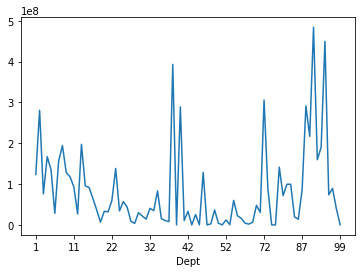

In [36]:
# over entire set of stores, cumuluative sum of weekly_sales over date range for each department.

df.sort_values(['Date','Dept']).groupby('Dept')['Weekly_Sales'].sum().plot();


/Users/marshallbanana/opt/anaconda3/lib/python3.8/site-packages/matplotlib/axes/_base.py:405: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


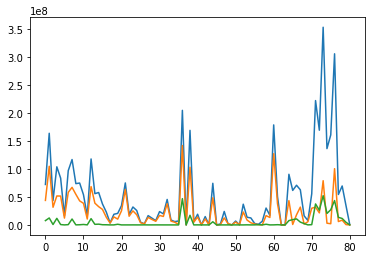

In [116]:
# "Weekly_Sales" cumulative sum of Type A, B, C stores over entire date range.
# Type A, B stores have similar peaks.  Type C lacks the peaks of Types A, B stores.

fig, ax = plt.subplots()

ax.plot(df[df['Type'] == 'A'].sort_values(['Date','Dept']).groupby('Dept')['Weekly_Sales'].sum())
ax.plot(df[df['Type'] == 'B'].sort_values(['Date','Dept']).groupby('Dept')['Weekly_Sales'].sum())
ax.plot(df[df['Type'] == 'C'].sort_values(['Date','Dept']).groupby('Dept')['Weekly_Sales'].sum())
plt.show();

# 'IsHoliday' Feature

## How do 'IsHoliday' 

1.  Some departments show considerable difference in cumulative sum dependent on 'IsHoliday' Feature

<AxesSubplot:xlabel='Store'>

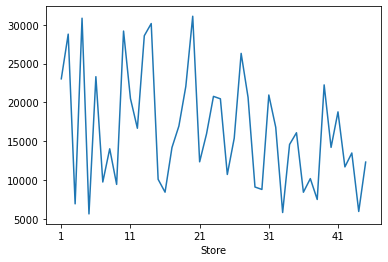

In [38]:
# subset all holiday periods, average Weekly_Sales aggregated over all departments by Store

df[df['IsHoliday'] == 1].sort_values(['Date','Store']).groupby('Store')['Weekly_Sales'].mean().plot()

<AxesSubplot:xlabel='Store'>

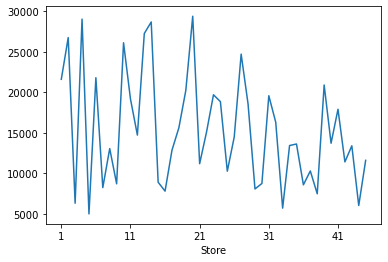

In [39]:
# subset all non-holiday periods, average Weekly_Sales aggregated over all departments by Store

df[df['IsHoliday'] == 0].sort_values(['Date','Store']).groupby('Store')['Weekly_Sales'].mean().plot()

/Users/marshallbanana/opt/anaconda3/lib/python3.8/site-packages/matplotlib/axes/_base.py:405: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  x = x[:, np.newaxis]


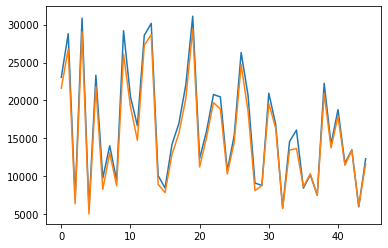

In [40]:
# Average Weekly_Sales for each store.  'IsHoliday' True vs False

fig, ax = plt.subplots()

ax.plot(df[df['IsHoliday'] == 1].sort_values(['Date','Store']).groupby('Store')['Weekly_Sales'].mean())
ax.plot(df[df['IsHoliday'] == 0].sort_values(['Date','Store']).groupby('Store')['Weekly_Sales'].mean())

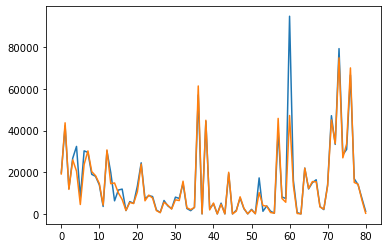

In [41]:
# Average Weekly_Sales by 'Dept'.  'IsHoliday' True vs False.
# peaks roughly match between two plots with the following exceptions:
# 1.  Dept. 60 shows large difference in weekly_sales.  Dept 5 and 51 have similar but smaller differences in 
# weekly_sales mean for holiday vs non-holiday weeks.

fig, ax = plt.subplots()

ax.plot(df[df['IsHoliday'] == 1].sort_values(['Date','Store']).groupby('Dept')['Weekly_Sales'].mean())
ax.plot(df[df['IsHoliday'] == 0].sort_values(['Date','Store']).groupby('Dept')['Weekly_Sales'].mean())

# 'Size' Feature

## Dept "Weekly_Sales" vs Size?  Store Weekly Sales vs Size?

1.  Larger Store size correlated with large weekly_sales?  Yes, regression plot shows increased weekly_sales for larger store size.

In [42]:
df.head()

,Date,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,isocalendar,Type,Size,cci_value
0,2010-02-05,1,1,24924.50,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
1,2010-02-05,1,2,50605.27,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
2,2010-02-05,1,3,13740.12,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
3,2010-02-05,1,4,39954.04,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
4,2010-02-05,1,5,32229.38,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324


In [43]:
# Store numbers list
store_num = df['Store'].unique().to_list()

# size function to return store size
def size(store_num):
    return df[df['Store']==store_num]['Size'].unique()[0]

In [44]:
# Several stores share Size values. 203819 sf for Stores 19,24.  39690 sf for Stores 33,38,42.
#. 39910 sf for Stores 36, 37, 44.

list = df['Size'].unique()

for item in list:
    if df[df['Size']==item]['Store'].nunique() > 1:
        print(df[df['Size']==item]['Store'].unique())

[19, 24]
Categories (2, int64): [19, 24]
[33, 38, 42]
Categories (3, int64): [33, 38, 42]
[36, 37, 44]
Categories (3, int64): [36, 37, 44]


In [45]:
# Store size list

# function def to return store number based on size
def store(size):
    return df[df['Size']==size]['Store'].unique()

In [46]:
list = [19,33,36]

[size(x) for x in list]

[203819, 39690, 39910]

In [47]:
df

,Date,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,isocalendar,Type,Size,cci_value
0,2010-02-05,1,1,24924.50,0,42.31,2.572,0.00,0.00,0.0,0.00,0.00,211.096358,8.106,"(2010, 5)",A,151315,98.22324
1,2010-02-05,1,2,50605.27,0,42.31,2.572,0.00,0.00,0.0,0.00,0.00,211.096358,8.106,"(2010, 5)",A,151315,98.22324
2,2010-02-05,1,3,13740.12,0,42.31,2.572,0.00,0.00,0.0,0.00,0.00,211.096358,8.106,"(2010, 5)",A,151315,98.22324
3,2010-02-05,1,4,39954.04,0,42.31,2.572,0.00,0.00,0.0,0.00,0.00,211.096358,8.106,"(2010, 5)",A,151315,98.22324
4,2010-02-05,1,5,32229.38,0,42.31,2.572,0.00,0.00,0.0,0.00,0.00,211.096358,8.106,"(2010, 5)",A,151315,98.22324
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
421565,2012-10-26,45,93,2487.80,0,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,"(2012, 43)",B,118221,99.10398
421566,2012-10-26,45,94,5203.31,0,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,"(2012, 43)",B,118221,99.10398
421567,2012-10-26,45,95,56017.47,0,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,"(2012, 43)",B,118221,99.10398
421568,2012-10-26,45,97,6817.48,0,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,"(2012, 43)",B,118221,99.10398


In [48]:
df_=df.groupby(['Date','Size'])['Weekly_Sales'].sum().reset_index()

In [49]:
df_

,Date,Size,Weekly_Sales
0,2010-02-05,34875,317173.10
1,2010-02-05,37392,461622.22
2,2010-02-05,39690,1176473.58
3,2010-02-05,39910,1284644.42
4,2010-02-05,41062,647029.28
...,...,...,...
5715,2012-10-26,204184,1703047.74
5716,2012-10-26,205863,2149594.46
5717,2012-10-26,206302,1213860.61
5718,2012-10-26,207499,1200729.45


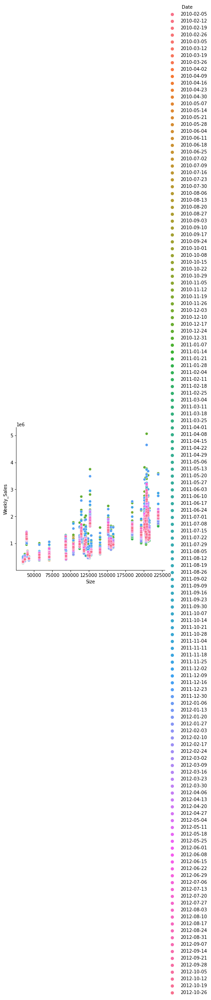

In [50]:
#regression plot of Weekly_Sales vs. Size
sns.relplot(data=df_, x="Size", y="Weekly_Sales", hue ='Date')

plt.show()

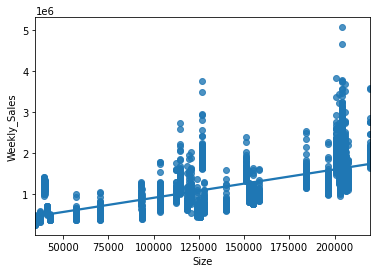

In [51]:
# regression plot indicates positive correlation between size and weekly_sales

sns.regplot(data=df_, x='Size', y="Weekly_Sales")
plt.show()


# 'cci_value' Feature

In [52]:
df.head()


,Date,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,isocalendar,Type,Size,cci_value
0,2010-02-05,1,1,24924.50,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
1,2010-02-05,1,2,50605.27,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
2,2010-02-05,1,3,13740.12,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
3,2010-02-05,1,4,39954.04,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
4,2010-02-05,1,5,32229.38,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324


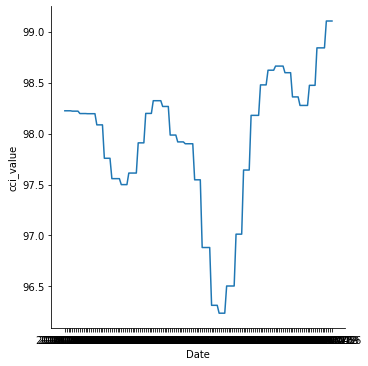

In [53]:
# plot of cci over date range for Store 1, Dept 1.

sns.relplot(data=df_, x=df[(df['Store']==1) & (df['Dept'] == 1)]['Date'],
            y = df[(df['Store']==1) & (df['Dept'] == 1)]['cci_value'], kind = 'line' )
plt.show()

In [54]:
# write function: given date, return cci_value
def cci_value(date):
    return df[df['Date']  == date]['cci_value'].unique()[0]

cci_value('2010-02-05')

98.22324

In [55]:
# groupby 'Date', 'Dept', Weekly_Sale sum by Dept

df_ = df.groupby(['Date','Dept'])['Weekly_Sales'].sum().reset_index()
df_

,Date,Dept,Weekly_Sales
0,2010-02-05,1,881833.41
1,2010-02-05,2,1997831.89
2,2010-02-05,3,484368.90
3,2010-02-05,4,1205801.77
4,2010-02-05,5,1116952.54
...,...,...,...
11578,2012-10-26,95,3002617.27
11579,2012-10-26,96,554038.58
11580,2012-10-26,97,596563.70
11581,2012-10-26,98,302469.28


In [56]:
df[df['Date']=='2010-02-05'].cci_value[0]

98.22324

In [57]:
#add in cci values 

df_['cci']= [cci_value(x) for x in df_['Date']]
df_

,Date,Dept,Weekly_Sales,cci
0,2010-02-05,1,881833.41,98.22324
1,2010-02-05,2,1997831.89,98.22324
2,2010-02-05,3,484368.90,98.22324
3,2010-02-05,4,1205801.77,98.22324
4,2010-02-05,5,1116952.54,98.22324
...,...,...,...,...
11578,2012-10-26,95,3002617.27,99.10398
11579,2012-10-26,96,554038.58,99.10398
11580,2012-10-26,97,596563.70,99.10398
11581,2012-10-26,98,302469.28,99.10398


In [58]:
df_.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11583 entries, 0 to 11582
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   Date          11583 non-null  object  
 1   Dept          11583 non-null  category
 2   Weekly_Sales  11090 non-null  float64 
 3   cci           11583 non-null  float64 
dtypes: category(1), float64(2), object(1)
memory usage: 286.0+ KB


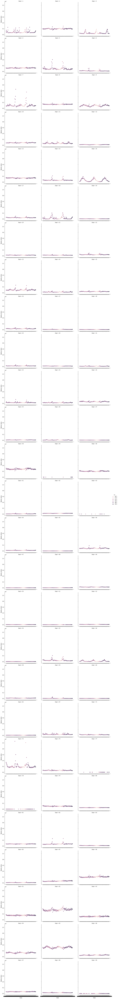

In [59]:
# for all stores, subset by department.  plot weekly_sales sum by date.  color by 'cci' value.
# some dept show peaks in weekly_sales, but no increasing trend over time.  
# cci color trends further reinforces absence of correlation.

sns.relplot(data = df_, x="Date", y="Weekly_Sales", col = 'Dept', col_wrap = 3, hue='cci')
plt.show()

# 'Temperature' Feature

1.  How does temperature affect total weekly_sales?  No strong correlations evidence in scatterplots of weekly_sales vs temperature.

In [60]:
df.head()

,Date,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,isocalendar,Type,Size,cci_value
0,2010-02-05,1,1,24924.50,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
1,2010-02-05,1,2,50605.27,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
2,2010-02-05,1,3,13740.12,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
3,2010-02-05,1,4,39954.04,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
4,2010-02-05,1,5,32229.38,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324


In [61]:
df.sort_values(['Date','Store','Temperature'])

,Date,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,isocalendar,Type,Size,cci_value
0,2010-02-05,1,1,24924.50,0,42.31,2.572,0.00,0.00,0.0,0.00,0.00,211.096358,8.106,"(2010, 5)",A,151315,98.22324
1,2010-02-05,1,2,50605.27,0,42.31,2.572,0.00,0.00,0.0,0.00,0.00,211.096358,8.106,"(2010, 5)",A,151315,98.22324
2,2010-02-05,1,3,13740.12,0,42.31,2.572,0.00,0.00,0.0,0.00,0.00,211.096358,8.106,"(2010, 5)",A,151315,98.22324
3,2010-02-05,1,4,39954.04,0,42.31,2.572,0.00,0.00,0.0,0.00,0.00,211.096358,8.106,"(2010, 5)",A,151315,98.22324
4,2010-02-05,1,5,32229.38,0,42.31,2.572,0.00,0.00,0.0,0.00,0.00,211.096358,8.106,"(2010, 5)",A,151315,98.22324
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
421565,2012-10-26,45,93,2487.80,0,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,"(2012, 43)",B,118221,99.10398
421566,2012-10-26,45,94,5203.31,0,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,"(2012, 43)",B,118221,99.10398
421567,2012-10-26,45,95,56017.47,0,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,"(2012, 43)",B,118221,99.10398
421568,2012-10-26,45,97,6817.48,0,58.85,3.882,4018.91,58.08,100.0,211.94,858.33,192.308899,8.667,"(2012, 43)",B,118221,99.10398


In [62]:
# Cumulative Sum of Weekly_Sales for Store #1 Date 2010-02-05

df[(df['Date']== '2010-02-05') & (df['Store'] == 1)]['Weekly_Sales'].sum()

1643690.9

In [63]:
# test function

def test_function(x,y):
    return x,y

test_function(1,2)

(1, 2)

In [64]:
df[(df['Date'] == '2010-02-05') & (df['Store'] == 1)]['Temperature'][0]

42.31

In [65]:
df_ = df.groupby(['Date','Store'])['Weekly_Sales'].sum().reset_index()
df_

,Date,Store,Weekly_Sales
0,2010-02-05,1,1643690.90
1,2010-02-05,2,2136989.46
2,2010-02-05,3,461622.22
3,2010-02-05,4,2135143.87
4,2010-02-05,5,317173.10
...,...,...,...
6430,2012-10-26,41,1316542.59
6431,2012-10-26,42,514756.08
6432,2012-10-26,43,587603.55
6433,2012-10-26,44,361067.07


In [66]:
# find temperature given date and store

def temp(date, store):
    return df[(df['Date'] == date) & (df['Store'] == store)]['Temperature'].max()

temp('2010-02-05', 1)

42.31

In [67]:
zip_ = zip(df_['Date'],df_['Store'])

list = tuple(zip_)
temp(list[0][0], list[0][1])

#for x in list:
#    date = x[0]
#    store = x[1]
#    print(temp(date,store))
    
df_['temp']=[temp(x[0], x[1]) for x in list]

In [68]:
df_

,Date,Store,Weekly_Sales,temp
0,2010-02-05,1,1643690.90,42.31
1,2010-02-05,2,2136989.46,40.19
2,2010-02-05,3,461622.22,45.71
3,2010-02-05,4,2135143.87,43.76
4,2010-02-05,5,317173.10,39.70
...,...,...,...,...
6430,2012-10-26,41,1316542.59,41.80
6431,2012-10-26,42,514756.08,70.50
6432,2012-10-26,43,587603.55,69.17
6433,2012-10-26,44,361067.07,46.97


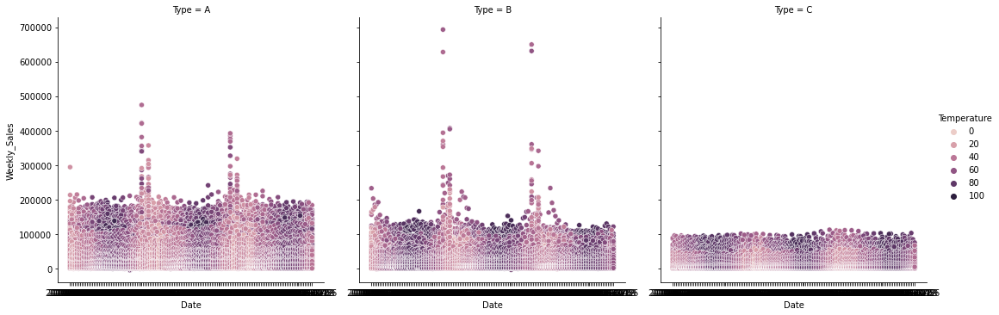

In [69]:
# color pattern of scatterplot points does not indicate correlation with temperature for any store type
sns.relplot(data=df, x='Date', y='Weekly_Sales', col='Type', col_wrap=3, hue='Temperature')
plt.show()

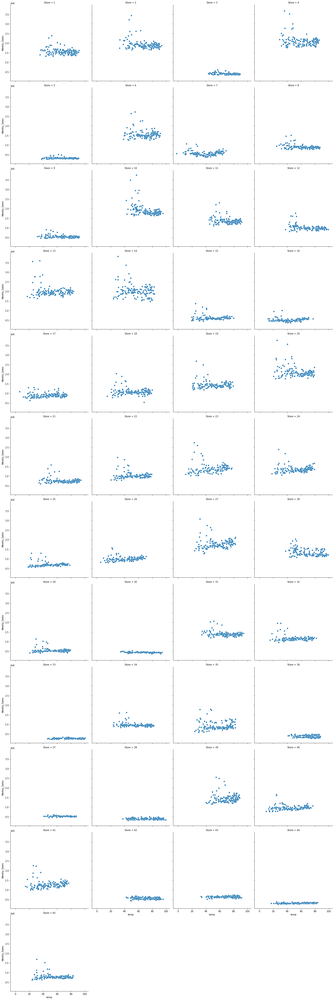

In [70]:
# for each store, scatterplot of aggregated weekly_sales for each date vs. temperature.  no positive correlations
# for any store.

sns.relplot(data = df_, x='temp', y="Weekly_Sales", col='Store', col_wrap=4)
plt.show()

# 'Fuel_Price' Feature

## weekly_sales vs fuel price

1.  Scatterplot of weekly_sales vs fuel prices does not indicate correlation between the two.
   

### Non-Aggregate Weekly_Sales plots

In [71]:
df.head()

,Date,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,isocalendar,Type,Size,cci_value
0,2010-02-05,1,1,24924.50,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
1,2010-02-05,1,2,50605.27,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
2,2010-02-05,1,3,13740.12,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
3,2010-02-05,1,4,39954.04,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
4,2010-02-05,1,5,32229.38,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324


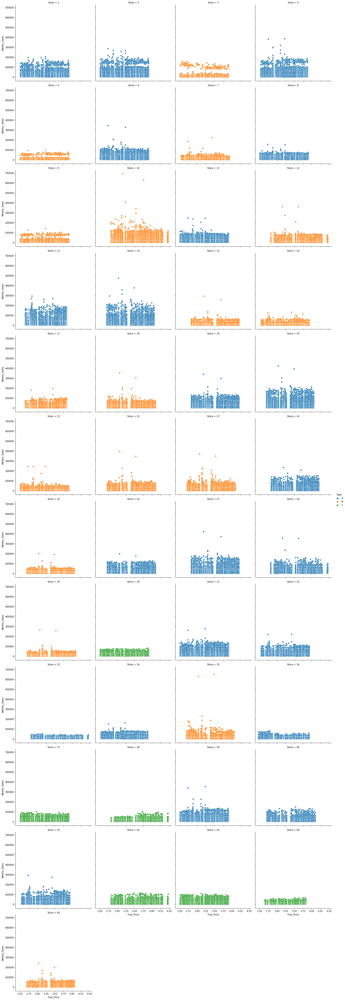

In [72]:
sns.relplot(data=df, x='Fuel_Price', y='Weekly_Sales', col='Store', col_wrap=4, hue='Type')
plt.show()

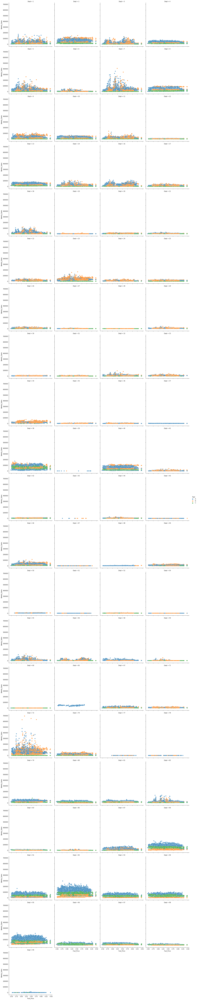

In [73]:
sns.relplot(data=df, x='Fuel_Price', y='Weekly_Sales', col='Dept', col_wrap=4, hue='Type')
plt.show()

### Aggregated Weekly_Sales

1. by store
2. by dept

In [74]:
df.head()

,Date,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,isocalendar,Type,Size,cci_value
0,2010-02-05,1,1,24924.50,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
1,2010-02-05,1,2,50605.27,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
2,2010-02-05,1,3,13740.12,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
3,2010-02-05,1,4,39954.04,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
4,2010-02-05,1,5,32229.38,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324


In [75]:
# for each date, aggregate weekly_sales for each store

df_ = df.groupby(['Date','Store']).sum()['Weekly_Sales'].reset_index()
df_

,Date,Store,Weekly_Sales
0,2010-02-05,1,1643690.90
1,2010-02-05,2,2136989.46
2,2010-02-05,3,461622.22
3,2010-02-05,4,2135143.87
4,2010-02-05,5,317173.10
...,...,...,...
6430,2012-10-26,41,1316542.59
6431,2012-10-26,42,514756.08
6432,2012-10-26,43,587603.55
6433,2012-10-26,44,361067.07


In [76]:
 df[(df['Date'] == "2010-02-05") & (df['Store'] == 1)]["Fuel_Price"][0]

2.572

In [77]:
# find fuel price given store, date

def fuel(date, store):
    return df[(df['Date'] == date) & (df['Store'] == store)]["Fuel_Price"].value_counts().keys()[0]
    
fuel("2010-02-05", 1)

2.572

In [78]:
zip_ = zip(df_['Date'],df_['Store'])

list = tuple(zip_)
temp(list[0][0], list[0][1])

#for x in list:
#    date = x[0]
#    store = x[1]
#    print(temp(date,store))
    
df_['temp']=[temp(x[0], x[1]) for x in list]

In [79]:
z = zip(df_["Date"], df_["Store"])

list = tuple(z)
#for x in list:
    #print(x[0], x[1])
    
df_['fuel_price'] = [fuel(x[0], x[1]) for x in list]

In [80]:
df_

,Date,Store,Weekly_Sales,temp,fuel_price
0,2010-02-05,1,1643690.90,42.31,2.572
1,2010-02-05,2,2136989.46,40.19,2.572
2,2010-02-05,3,461622.22,45.71,2.572
3,2010-02-05,4,2135143.87,43.76,2.598
4,2010-02-05,5,317173.10,39.70,2.572
...,...,...,...,...,...
6430,2012-10-26,41,1316542.59,41.80,3.686
6431,2012-10-26,42,514756.08,70.50,4.301
6432,2012-10-26,43,587603.55,69.17,3.506
6433,2012-10-26,44,361067.07,46.97,3.755


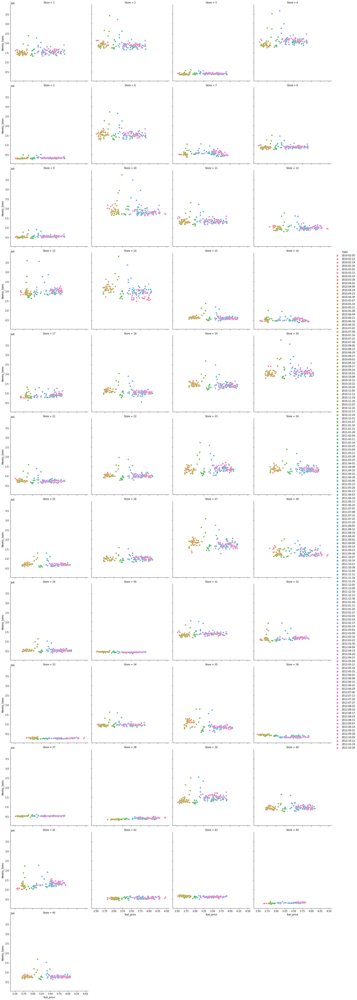

In [81]:
# for each store: dept weekly_sales summed for each date vs fuel price.  no strong correlations between fuel price and 
# weekly_sales evidenced at any store.

sns.relplot(data=df_, x='fuel_price', y="Weekly_Sales", col="Store", col_wrap = 4, hue="Date")
plt.show();

In [82]:
# for each date, aggregate weekly_sales for each store

df_ = df.groupby(['Date','Dept']).sum()['Weekly_Sales'].reset_index()
df_

,Date,Dept,Weekly_Sales
0,2010-02-05,1,881833.41
1,2010-02-05,2,1997831.89
2,2010-02-05,3,484368.90
3,2010-02-05,4,1205801.77
4,2010-02-05,5,1116952.54
...,...,...,...
11578,2012-10-26,95,3002617.27
11579,2012-10-26,96,554038.58
11580,2012-10-26,97,596563.70
11581,2012-10-26,98,302469.28


In [83]:
df_['fuel_price'] = df.groupby(['Date','Dept'])['Fuel_Price'].mean().reset_index()['Fuel_Price']

df_

,Date,Dept,Weekly_Sales,fuel_price
0,2010-02-05,1,881833.41,2.717844
1,2010-02-05,2,1997831.89,2.717844
2,2010-02-05,3,484368.90,2.717844
3,2010-02-05,4,1205801.77,2.717844
4,2010-02-05,5,1116952.54,2.717844
...,...,...,...,...
11578,2012-10-26,95,3002617.27,3.791489
11579,2012-10-26,96,554038.58,3.791297
11580,2012-10-26,97,596563.70,3.797977
11581,2012-10-26,98,302469.28,3.811881


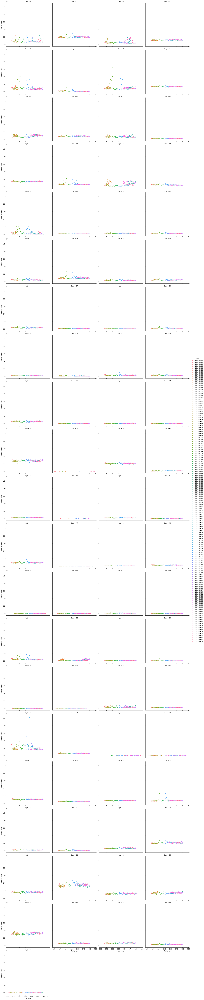

In [84]:
sns.relplot(data=df_, x='fuel_price', y="Weekly_Sales", hue="Date", col="Dept", col_wrap=4)
plt.show();

# 'MarkDown1', 'MarkDown2', 'MarkDown3', 'MarkDown4', 'MarkDown5'

In [85]:
df.head()

,Date,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,isocalendar,Type,Size,cci_value
0,2010-02-05,1,1,24924.50,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
1,2010-02-05,1,2,50605.27,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
2,2010-02-05,1,3,13740.12,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
3,2010-02-05,1,4,39954.04,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
4,2010-02-05,1,5,32229.38,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324


In [130]:
df_ = df.groupby('MarkDown1')['Weekly_Sales'].sum().reset_index()
#df_= df_.drop(labels=0)
df_

,MarkDown1,Weekly_Sales
0,0.00,4.293853e+09
1,0.27,4.071865e+05
2,0.50,2.200604e+05
3,1.50,9.638588e+05
4,1.94,3.253279e+05
...,...,...
2273,62567.60,7.469010e+05
2274,65021.23,1.249697e+06
2275,75149.79,1.935300e+06
2276,78124.50,1.877410e+06


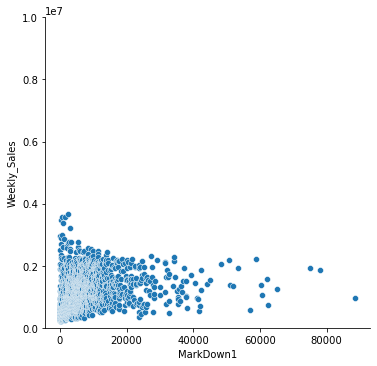

In [133]:
# scatterplot of weekly_sales vs MarkDown 1.  no positive correlation identified.
sns.relplot(data=df_, x="MarkDown1", y="Weekly_Sales")
plt.ylim(0,10000000)

plt.show()

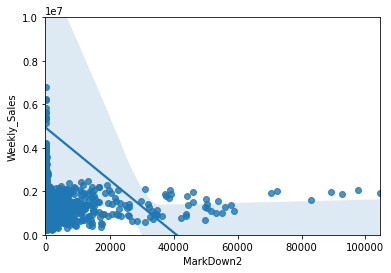

In [167]:
df_ = df.groupby('MarkDown2')['Weekly_Sales'].sum().reset_index()

# scatterplot of weekly_sales vs MarkDown 2.  no positive correlation identified.

sns.regplot(data=df_, x="MarkDown2", y="Weekly_Sales")
plt.ylim(0,10000000)
plt.show()

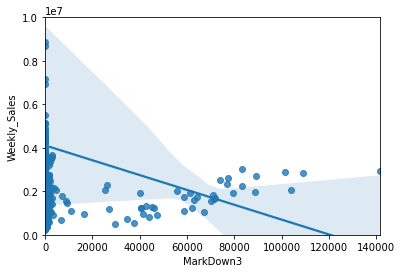

In [153]:
df_ = df.groupby('MarkDown3', dropna=True)['Weekly_Sales'].sum().reset_index()
df_
# scatterplot of weekly_sales vs MarkDown 3.  no positive correlation identified.

sns.regplot(data=df_, x="MarkDown3", y="Weekly_Sales")
plt.ylim(0,10000000)
plt.show()

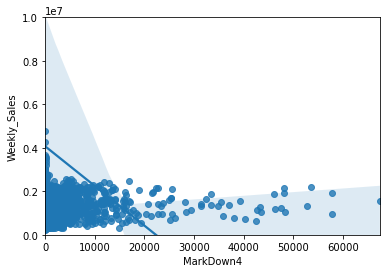

In [149]:
df_ = df.groupby('MarkDown4', dropna=False)['Weekly_Sales'].sum().reset_index()
df_
# scatterplot of weekly_sales vs MarkDown 4.  possible small positive correlation?

sns.regplot(data=df_, x="MarkDown4", y="Weekly_Sales")
plt.ylim(0,10000000)
plt.show()

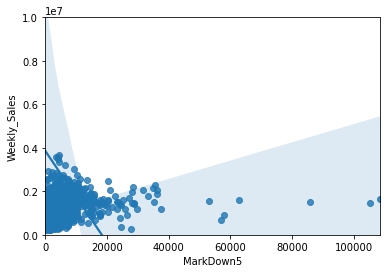

In [154]:
df_ = df.groupby('MarkDown5')['Weekly_Sales'].sum().reset_index()
df_
# scatterplot of weekly_sales vs MarkDown 4.  no positive correlation identified.

sns.regplot(data=df_, x="MarkDown5", y="Weekly_Sales")
plt.ylim(0,10000000)
plt.show()

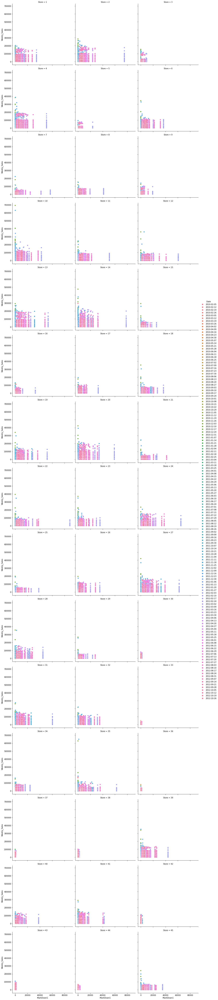

In [90]:
sns.relplot(data=df, x='MarkDown1', y="Weekly_Sales", col='Store', col_wrap= 3, hue='Date')
plt.show()

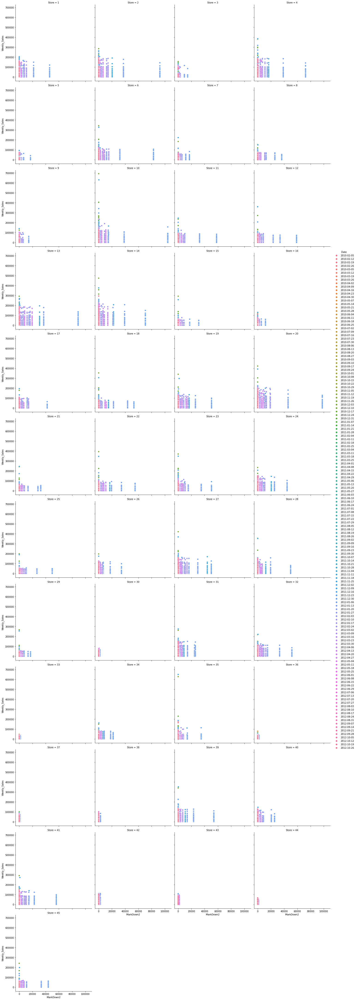

In [91]:
sns.relplot(data=df, x='MarkDown2', y="Weekly_Sales", col='Store', col_wrap= 4, hue='Date')
plt.show();

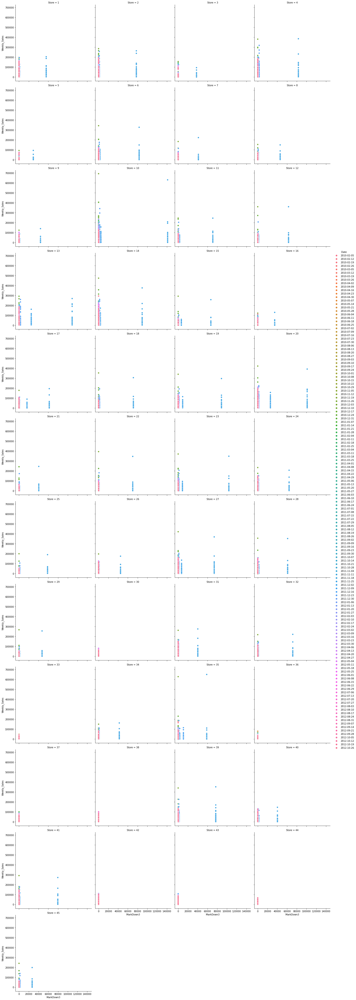

In [92]:
sns.relplot(data=df, x='MarkDown3', y="Weekly_Sales", col='Store', col_wrap= 4, hue='Date')
plt.show();

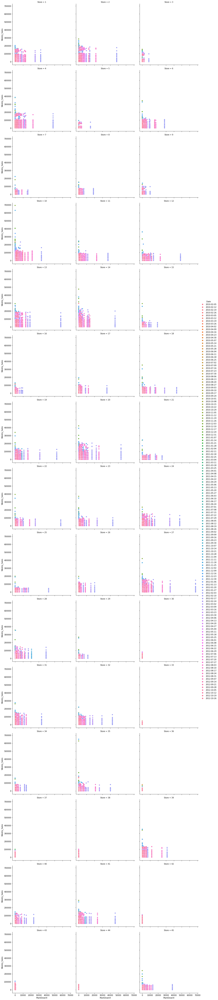

In [93]:
sns.relplot(data=df, x='MarkDown4', y="Weekly_Sales", col='Store', col_wrap= 3, hue='Date')
plt.show();

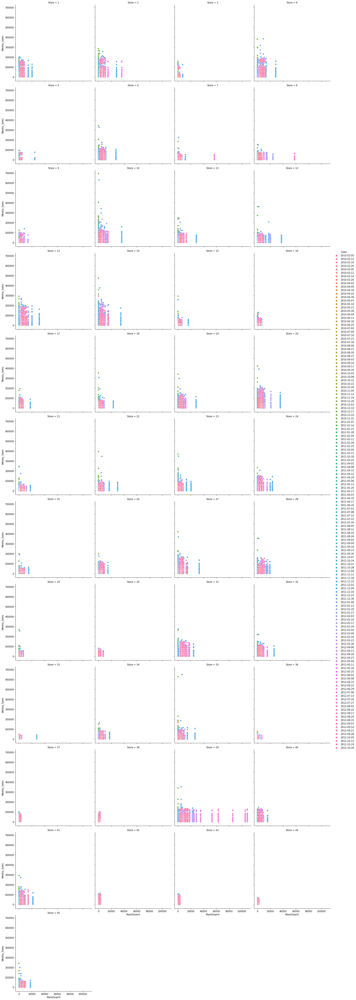

In [94]:
sns.relplot(data=df, x='MarkDown5', y="Weekly_Sales", col='Store', col_wrap= 4, hue='Date')
plt.show();

# 'CPI' Feature

In [95]:
df_ = pd.DataFrame(df.groupby('Date')['Weekly_Sales'].sum())

df_['CPI'] = df.groupby("Date")["CPI"].mean()

df_ = df_.reset_index()
df_

,Date,Weekly_Sales,CPI
0,2010-02-05,49750740.50,167.398405
1,2010-02-12,48336677.63,167.384138
2,2010-02-19,48276993.78,167.338966
3,2010-02-26,43968571.13,167.691019
4,2010-03-05,46871470.30,167.727351
...,...,...,...
138,2012-09-28,43734899.40,175.919639
139,2012-10-05,47566639.31,175.998254
140,2012-10-12,46128514.25,176.123786
141,2012-10-19,45122410.57,176.295499


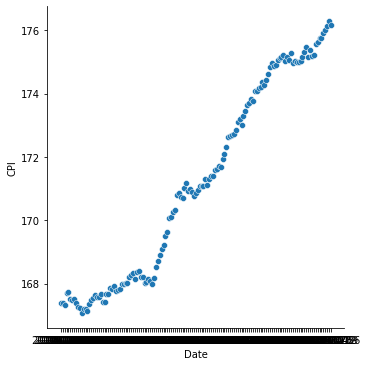

In [97]:
# CPI vs Date plot.  CPI steadily increases over date range. begins roughly 167 and ends slightly above 176.

sns.relplot(data = df_, x="Date", y="CPI")
plt.show()

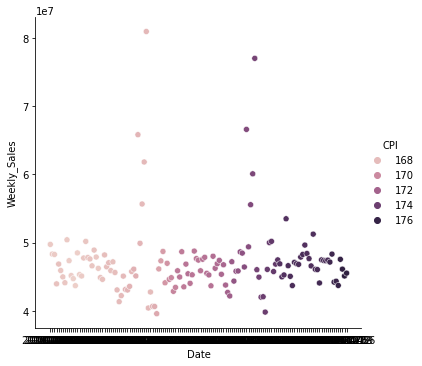

In [98]:
# scatterplot: CPI vs Weekly_Sales for all Stores

# weekly_sales summed over all stores doesn't appear to be correlated to CPI values

sns.relplot(data = df_, x="Date", y="Weekly_Sales", hue='CPI')

plt.show()

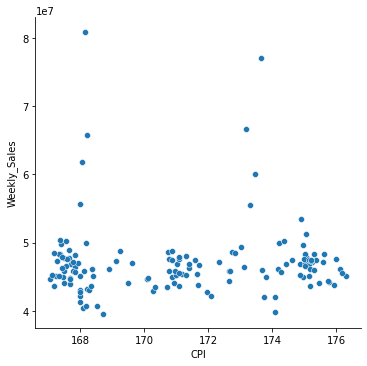

In [100]:
# scatterplot: CPI vs Weekly_Sales for all Stores

# weekly_sales summed over all stores doesn't appear to be correlated to CPI values

sns.relplot(data = df_, x="CPI", y="Weekly_Sales")

plt.show()

In [101]:
# by Store Type?  Maybe CPI affect will show up 

# 'Unemployment' Feature

In [102]:
df.head()


,Date,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,isocalendar,Type,Size,cci_value
0,2010-02-05,1,1,24924.50,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
1,2010-02-05,1,2,50605.27,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
2,2010-02-05,1,3,13740.12,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
3,2010-02-05,1,4,39954.04,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
4,2010-02-05,1,5,32229.38,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324


In [103]:
z = pd.DataFrame(df.groupby('Date')['Unemployment'].mean())
z = z.reset_index()
z

,Date,Unemployment
0,2010-02-05,8.576731
1,2010-02-12,8.567309
2,2010-02-19,8.576351
3,2010-02-26,8.561375
4,2010-03-05,8.572689
...,...,...
138,2012-09-28,7.225855
139,2012-10-05,6.942141
140,2012-10-12,6.952682
141,2012-10-19,6.948928


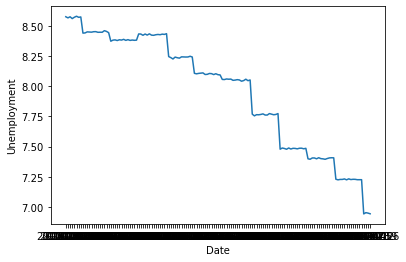

In [104]:
sns.lineplot(data=z, x="Date", y="Unemployment")
plt.show()

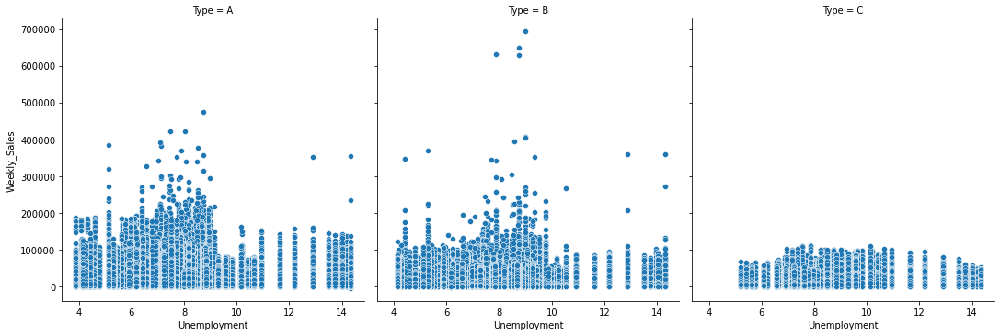

In [105]:
sns.relplot(data=df, x="Unemployment", y="Weekly_Sales", col="Type")
plt.show()

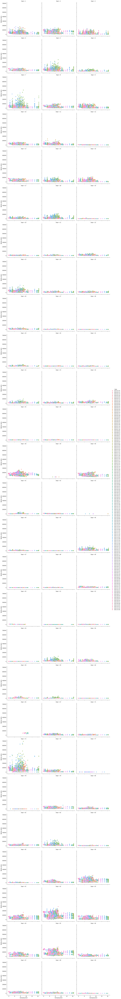

In [106]:
sns.relplot(data=df, x="Unemployment", y="Weekly_Sales", col="Dept", col_wrap=3, hue="Date")
plt.show()

# Correlation Heatmap

Summary:  'Size' Feature has largest correlation value, 0.24, with Weekly_Sales.  This is not indicative of a strong correlation.  All other numerical features correlation values fall in range from -0.0034 to 0.047.

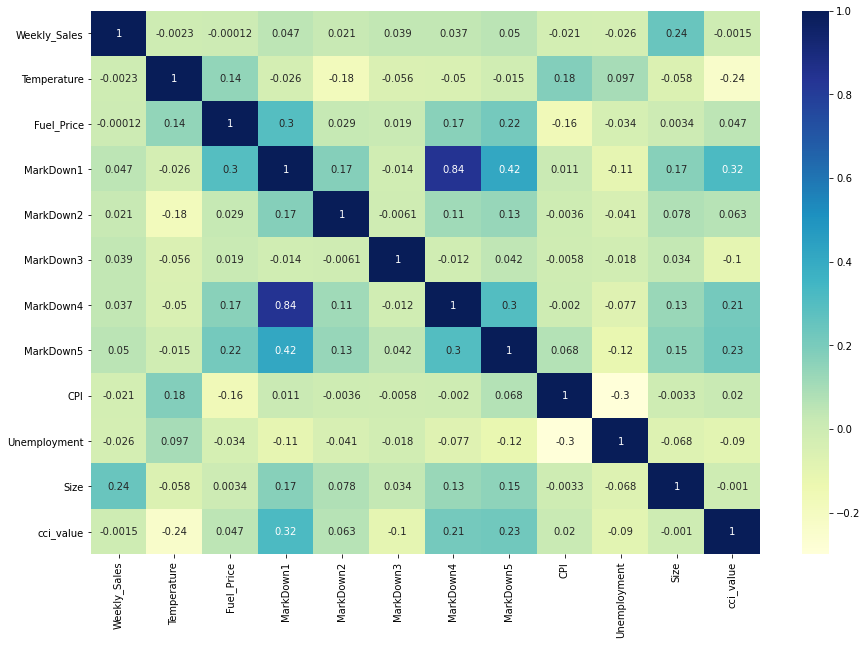

In [107]:
#
fig, size = plt.subplots(figsize=(15,10))

sns.heatmap(df.corr(), cmap='YlGnBu', annot=True)
plt.show()

# Principal Component Analysis

Summary:

1. first principal component is responsible for approx. 20% of variance.  
2. second principal component is responsible for approx. 11% of variance.  
3. remaining explained variance is spread relatively evenly over remaining principal components.  
4.  feature selection using first two principal components possible?

In [108]:
df.head()

,Date,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,isocalendar,Type,Size,cci_value
0,2010-02-05,1,1,24924.50,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
1,2010-02-05,1,2,50605.27,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
2,2010-02-05,1,3,13740.12,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
3,2010-02-05,1,4,39954.04,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324
4,2010-02-05,1,5,32229.38,0,42.31,2.572,0.0,0.0,0.0,0.0,0.0,211.096358,8.106,"(2010, 5)",A,151315,98.22324


In [109]:
# drop categorical features. standardize and scale data.  

# Create the scaler and standardize the data
scaler = StandardScaler()
df_std = scaler.fit_transform(df.drop(['Date','Store','Dept','IsHoliday', 'Type','isocalendar'], axis = 1))

df_std = pd.DataFrame(df_std, columns = df.columns.drop(['Date','Store','Dept','IsHoliday', 'Type','isocalendar']))

df_std.head()

,Weekly_Sales,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,MarkDown4,MarkDown5,CPI,Unemployment,Size,cci_value
0,0.393782,-0.963798,-1.720834,-0.427943,-0.173069,-0.084662,-0.278117,-0.395181,1.018774,0.078201,0.239209,0.434755
1,1.524538,-0.963798,-1.720834,-0.427943,-0.173069,-0.084662,-0.278117,-0.395181,1.018774,0.078201,0.239209,0.434755
2,-0.098680,-0.963798,-1.720834,-0.427943,-0.173069,-0.084662,-0.278117,-0.395181,1.018774,0.078201,0.239209,0.434755
3,1.055551,-0.963798,-1.720834,-0.427943,-0.173069,-0.084662,-0.278117,-0.395181,1.018774,0.078201,0.239209,0.434755
4,0.715425,-0.963798,-1.720834,-0.427943,-0.173069,-0.084662,-0.278117,-0.395181,1.018774,0.078201,0.239209,0.434755


[0.20714405 0.31909582 0.42841457 0.53207804 0.61764555 0.69503421
 0.76970372 0.83485727 0.89769649 0.94868981 0.98886176 1.        ]


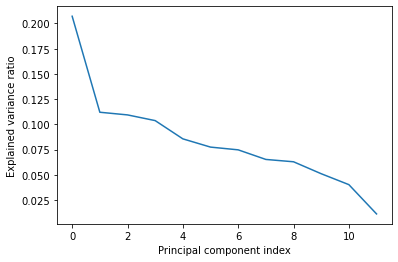

In [110]:
# Create the PCA instance and fit and transform the data with pca
pca = PCA()
df_pca = pca.fit_transform(df_std)
print(pca.explained_variance_ratio_.cumsum())

var=pca.explained_variance_ratio_


# plot of explained variance ratio vs principal component index
plt.plot(var)
plt.xlabel('Principal component index')
plt.ylabel('Explained variance ratio')
plt.show()

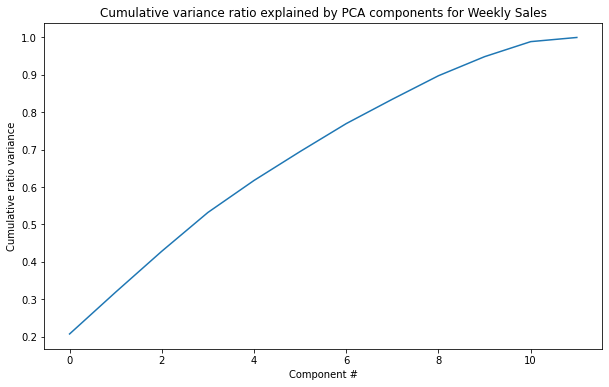

In [111]:
# explained variance is spread over all principal components

plt.subplots(figsize=(10, 6))
plt.plot(pca.explained_variance_ratio_.cumsum())
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
plt.title('Cumulative variance ratio explained by PCA components for Weekly Sales');

In [112]:
# PC1, PC2, PC3, PC4 vectors
pca.components_

array([[ 0.07941531, -0.09345548,  0.2355852 ,  0.57187708,  0.18527642,
        -0.00477091,  0.51587325,  0.39627282,  0.01578665, -0.1468534 ,
         0.18378176,  0.29885975],
       [-0.09489671,  0.03511045,  0.35384603,  0.09450855, -0.04635488,
        -0.02670725,  0.09670646, -0.06270829, -0.67765913,  0.59709282,
        -0.14034251, -0.0635509 ],
       [ 0.14325137, -0.72277587, -0.3361175 , -0.11983739,  0.34177726,
         0.05967375, -0.10301131, -0.09547156, -0.30717505,  0.03865878,
         0.17571666,  0.25082254],
       [ 0.61897902,  0.168779  ,  0.07020218, -0.04319149, -0.01761538,
         0.3062489 , -0.04624679,  0.05007685, -0.09260955,  0.06969911,
         0.57635194, -0.37043699],
       [-0.30337014, -0.14368536,  0.23039245, -0.03841699,  0.16231912,
         0.81739195, -0.06376935,  0.1334462 , -0.0200262 , -0.18914648,
        -0.21096726, -0.18901954],
       [-0.14813585,  0.16044394,  0.09274539, -0.02896721,  0.84020708,
        -0.28968467, -

In [113]:
df['PC 1'] = df_pca[:,0]
df['PC 2'] = df_pca[:,1]
df['PC 3'] = df_pca[:,2]
df['PC 4'] = df_pca[:,3]
df['PC 5'] = df_pca[:,4]
df['PC 6'] = df_pca[:,5]
df['PC 7'] = df_pca[:,6]

df

,Date,Store,Dept,Weekly_Sales,IsHoliday,Temperature,Fuel_Price,MarkDown1,MarkDown2,MarkDown3,...,Type,Size,cci_value,PC 1,PC 2,PC 3,PC 4,PC 5,PC 6,PC 7
0,2010-02-05,1,1,24924.50,0,42.31,2.572,0.00,0.00,0.0,...,A,151315,98.22324,-0.682031,-1.417282,1.226041,-0.163134,-0.661136,-0.526291,0.865044
1,2010-02-05,1,2,50605.27,0,42.31,2.572,0.00,0.00,0.0,...,A,151315,98.22324,-0.592232,-1.524587,1.388023,0.536780,-1.004173,-0.693797,0.667283
2,2010-02-05,1,3,13740.12,0,42.31,2.572,0.00,0.00,0.0,...,A,151315,98.22324,-0.721140,-1.370549,1.155495,-0.467958,-0.511738,-0.453340,0.951172
3,2010-02-05,1,4,39954.04,0,42.31,2.572,0.00,0.00,0.0,...,A,151315,98.22324,-0.629477,-1.480082,1.320840,0.246487,-0.861897,-0.624323,0.749305
4,2010-02-05,1,5,32229.38,0,42.31,2.572,0.00,0.00,0.0,...,A,151315,98.22324,-0.656488,-1.447805,1.272117,0.035956,-0.758713,-0.573938,0.808791
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
421565,2012-10-26,45,93,2487.80,0,58.85,3.882,4018.91,58.08,100.0,...,B,118221,99.10398,0.552598,0.272384,-0.237015,-1.162514,0.006745,-0.508597,-0.754028
421566,2012-10-26,45,94,5203.31,0,58.85,3.882,4018.91,58.08,100.0,...,B,118221,99.10398,0.562093,0.261037,-0.219887,-1.088504,-0.029528,-0.526309,-0.774939
421567,2012-10-26,45,95,56017.47,0,58.85,3.882,4018.91,58.08,100.0,...,B,118221,99.10398,0.739778,0.048715,0.100625,0.296405,-0.708292,-0.857750,-1.166247
421568,2012-10-26,45,97,6817.48,0,58.85,3.882,4018.91,58.08,100.0,...,B,118221,99.10398,0.567738,0.254293,-0.209706,-1.044511,-0.051090,-0.536838,-0.787370


In [114]:
num_features = df.columns.drop(['Date','Store','Dept','IsHoliday', 'Type','isocalendar', 'PC 1','PC 2',
                               'PC 3', 'PC 4', 'PC 5', 'PC 6', 'PC 7'])

pc_features = [('PC ' + str(x)) for x in range(0,12)]
num_features_len = len(num_features)

<Figure size 1440x1440 with 0 Axes>

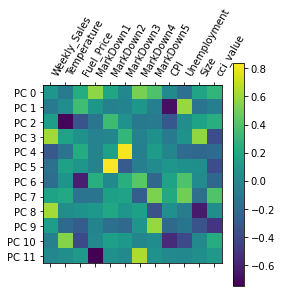

In [115]:
# heatmap of principal components

plt.figure(figsize = (20,20))
plt.matshow((pca.components_), cmap = 'viridis')
plt.yticks(range(len(pca.components_)), pc_features)
plt.colorbar()
plt.xticks(range(num_features_len), num_features, rotation=60, ha='left')

plt.show();
